In [61]:
# Import necessary libraries for data analysis and visualization
import os
import pandas as pd
import pdfplumber
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns

In [62]:
# Defines the relative path to the directory containing stock data files.
data_folder = "./stock_files/"
# Defines the name of the file intended for storing consolidated stock history.
history_file = "stock_history.csv"

In [63]:
# Uses the 'os' module to get a list of all entries (files/folders) within 'data_folder'.
files = os.listdir(data_folder)
files

['.fe_tmp',
 'DAILY_PRICE_LIST_APRIL_02_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_03_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_04_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_14_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_15_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_16_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_17_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_22_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_23_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_24_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_25_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_28_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_29_2025.pdf',
 'DAILY_PRICE_LIST_APRIL_30_2025.pdf',
 'DAILY_PRICE_LIST_MAY_02_2025.pdf',
 'DAILY_PRICE_LIST_MAY_05_2025.pdf',
 'DAILY_PRICE_LIST_MAY_07_2025.pdf',
 'DAILY_PRICE_LIST_MAY_08_2025.pdf',
 'DAILY_PRICE_LIST_MAY_09_2025.pdf',
 'DAILY_PRICE_LIST_MAY_12_2025.pdf',
 'DAILY_PRICE_LIST_MAY_13_2025.pdf',
 'DAILY_PRICE_LIST_MAY_14_2025.pdf',
 'DAILY_PRICE_LIST_MAY_15_2025.pdf',
 'DAILY_PRICE_LIST_MAY_16_2025.pdf',
 'DAILY_PRICE_LIST_MAY_19_2025.pdf',
 'DAILY_PRICE_LIST_MAY_20_2025.pdf'

In [64]:
all_data = []

In [65]:
if files: # Checks if the 'files' list (from os.listdir) is not empty.
    for file in files: # Iterates through each file/directory name found in the 'data_folder'.
        if file.endswith(".pdf"): # Checks if the current 'file' is a PDF file.
            # Extracts and formats the date from the PDF filename.
            file_date = file.replace("DAILY_PRICE_LIST", "").replace(".pdf","").lstrip("_")
            # Converts the extracted date string to a datetime object, then formats it as 'YYYY-MM-DD'.
            file_date = datetime.strptime(file_date, "%B_%d_%Y").strftime("%Y-%m-%d")
            # Constructs the full path to the current PDF file.
            file_path = os.path.join(data_folder, file)
            print(file_path) # Prints the full path of the PDF file being processed.

            stock_data = [] # Initializes an empty list to store stock data extracted from the current PDF.
            with pdfplumber.open(file_path) as pdf: # Opens the PDF file using pdfplumber for content extraction.
                for page in pdf.pages: # Iterates through each page in the opened PDF.
                    table = page.extract_table() # Attempts to extract a table from the current PDF page.
                    if table: # Checks if a table was successfully extracted from the page.
                        for row in table[1:]: # Iterates through rows in the extracted table, skipping the header (first row).
                            stock_data.append(row) # Appends each data row to the 'stock_data' list.

            # Filters out any rows from 'stock_data' that contain the string "NIGERIAN EXCHANGE".
            stock_data = [row for row in stock_data if "NIGERIAN EXCHANGE" not in row]
            # Appends the extracted 'stock_data' from the current PDF to a collective 'all_data' list.
            all_data.extend(stock_data)
            print(all_data) # Prints the accumulating 'all_data' list (for debugging/monitoring).

        if all_data: # Checks if 'all_data' (collected from all processed PDFs so far) is not empty.
            # Creates a Pandas DataFrame from 'all_data' with specified column names.
            df = pd.DataFrame(all_data, columns = ["S/N", "Symbol", "P_Close", "Open", "High", "Low", "Close", "Change", "%", "Deals", "Volume", "Value", "VWAP"])
            # Selects only the "Symbol", "Close", and "Volume" columns from the DataFrame.
            df = df[["Symbol", "Close", "Volume"]]
            df["Date"] = file_date # Adds a new "Date" column to the DataFrame with the extracted file date.
            # Attempts to convert "Close" and "Volume" columns to numeric, coercing errors to NaN.
            df[["Close", "Volume"]] == df[["Close","Volume"]].apply(pd.to_numeric, errors = "coerce")
            # Replaces empty strings with pandas.NA and then drops rows containing any NA values.
            df = df.replace(r'^\s*$', pd.NA, regex=True).dropna()

            if os.path.exists(history_file): # Checks if the 'history_file' already exists.
                # Appends the DataFrame to the 'history_file' without writing the header and without index.
                df.to_csv(history_file, mode = "a", header=False, index = False)
            else:
                # Writes the DataFrame to a new 'history_file' including the header but without index.
                df.to_csv(history_file, mode="w", header=True, index=False)

            print("Stock data successfully extracted and saved!") # Confirms successful extraction and saving.
        else:
            print("No valid stock data found in the files.") # Informs if no valid data was extracted from the current PDF.
else:
    print("No files found in the directory") # Informs if the initial 'files' list was empty.
                            

No valid stock data found in the files.
./stock_files/DAILY_PRICE_LIST_APRIL_02_2025.pdf
[['S/N', 'Symbol', '', '', '', '', '', '', '%', '', '', '', ''], ['1', 'ABBEYBDS', '4.73', '4.73', '4.73', '4.73', '4.73', '', '', '25', '226,748', '1,170,856.80', '5.16'], ['2', 'ABCTRANS', '1.38', '1.38', '1.40', '1.40', '1.40', '0.02', '1.45', '45', '867,077', '1,191,082.58', '1.37'], ['3', 'ACADEMY', '2.88', '2.88', '2.65', '2.65', '2.65', '-0.23', '-7.99', '19', '2,110,466', '5,593,261.38', '2.65'], ['4', 'ACCESSCORP', '22.35', '21.95', '22.80', '21.95', '22.65', '0.30', '1.34', '839', '15,043,234', '337,448,540.55', '22.43'], ['5', 'AFRIPRUD', '13.05', '13.05', '14.35', '14.00', '14.35', '1.30', '9.96', '216', '2,511,524', '35,450,019.15', '14.11'], ['6', 'AIICO', '1.60', '1.60', '1.60', '1.48', '1.55', '-0.05', '-3.13', '234', '11,356,232', '17,367,276.57', '1.53'], ['7', 'AIRTELAFRI', '2,156.90', '2,156.90', '2,156.90', '2,156.90', '2,156.90', '', '', '5', '76', '180,310.00', '2,372.50'], [

In [66]:
df.head()

,Symbol,Close,Volume,Date
1,ABBEYBDS,4.73,"226,748",2025-05-27
2,ABCTRANS,1.40,"867,077",2025-05-27
3,ACADEMY,2.65,"2,110,466",2025-05-27
4,ACCESSCORP,22.65,"15,043,234",2025-05-27
5,AFRIPRUD,14.35,"2,511,524",2025-05-27


In [67]:
df.shape

(4056, 4)

In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4056 entries, 1 to 4226
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Symbol  4056 non-null   object
 1   Close   4056 non-null   object
 2   Volume  4056 non-null   object
 3   Date    4056 non-null   object
dtypes: object(4)
memory usage: 158.4+ KB


In [69]:
df['Close'] = pd.to_numeric(df['Close'], errors='coerce') # Converts the 'Close' column to numeric, setting non-convertible values to NaN.
df['Volume'] = pd.to_numeric(df['Volume'].str.replace(',', ''), errors='coerce') # Removes commas from 'Volume' strings, then converts to numeric, setting non-convertible values to NaN.

In [70]:
df['Date'] = pd.to_datetime(df['Date']) # Converts the 'Date' column to datetime objects for proper temporal operations.

In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4056 entries, 1 to 4226
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Symbol  4056 non-null   object        
 1   Close   3907 non-null   float64       
 2   Volume  4056 non-null   int64         
 3   Date    4056 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 158.4+ KB


In [72]:
grouped_data = df.groupby(["Symbol","Date"]) # Groups the DataFrame 'df' by unique combinations of 'Symbol' and 'Date' for subsequent aggregation.

In [73]:
grouped_data.head(10)

,Symbol,Close,Volume,Date
1,ABBEYBDS,4.73,226748,2025-05-27
2,ABCTRANS,1.40,867077,2025-05-27
3,ACADEMY,2.65,2110466,2025-05-27
4,ACCESSCORP,22.65,15043234,2025-05-27
5,AFRIPRUD,14.35,2511524,2025-05-27
...,...,...,...,...
3576,GREENWETF,525.00,1051,2025-05-27
3604,MERVALUE,130.67,2259,2025-05-27
3745,MERVALUE,130.68,98,2025-05-27
3747,MORISON,3.25,600,2025-05-27


In [74]:
df.to_csv("output.csv", index= False) # Saves the DataFrame 'df' to a CSV file named "output.csv", excluding the DataFrame index.

In [75]:
df = df.sort_values(by=["Symbol", "Date"]) # Sorts the DataFrame 'df' first by 'Symbol' in ascending order, then by 'Date' in ascending order within each symbol.

In [76]:
df.head(10)

,Symbol,Close,Volume,Date
1,ABBEYBDS,4.73,226748,2025-05-27
137,ABBEYBDS,4.73,93,2025-05-27
271,ABBEYBDS,4.73,66000,2025-05-27
401,ABBEYBDS,6.74,216704,2025-05-27
537,ABBEYBDS,7.41,141848,2025-05-27
669,ABBEYBDS,8.15,503288,2025-05-27
801,ABBEYBDS,8.96,989001,2025-05-27
935,ABBEYBDS,9.76,3932594,2025-05-27
1069,ABBEYBDS,8.79,1760532,2025-05-27
1201,ABBEYBDS,8.79,246845,2025-05-27


In [77]:
df["Day"] = df.groupby("Symbol").cumcount() + 1 # Creates a new 'Day' column, numbering days sequentially for each unique 'Symbol' starting from 1.

In [78]:
df.head(10)

,Symbol,Close,Volume,Date,Day
1,ABBEYBDS,4.73,226748,2025-05-27,1
137,ABBEYBDS,4.73,93,2025-05-27,2
271,ABBEYBDS,4.73,66000,2025-05-27,3
401,ABBEYBDS,6.74,216704,2025-05-27,4
537,ABBEYBDS,7.41,141848,2025-05-27,5
669,ABBEYBDS,8.15,503288,2025-05-27,6
801,ABBEYBDS,8.96,989001,2025-05-27,7
935,ABBEYBDS,9.76,3932594,2025-05-27,8
1069,ABBEYBDS,8.79,1760532,2025-05-27,9
1201,ABBEYBDS,8.79,246845,2025-05-27,10


In [79]:
total_volume = df.groupby('Symbol')['Volume'].sum().reset_index().sort_values(by='Volume', ascending=False) # Calculates the total 'Volume' for each 'Symbol', converts the result to a DataFrame, and sorts it by 'Volume' in descending order.

In [80]:
total_volume

,Symbol,Volume
102,RR25WEMA,2825757551
38,FIDELITYBK,1881710069
3,ACCESSCORP,1120343337
45,GTCO,973651956
114,TANTALIZER,835469999
...,...,...
137,VSPBONDETF,4462
90,NOTORE,3138
44,GREENWETF,3129
134,VETINDETF,2864


In [81]:
top_10_volume = total_volume.head(10)

In [82]:
top_10_volume

,Symbol,Volume
102,RR25WEMA,2825757551
38,FIDELITYBK,1881710069
3,ACCESSCORP,1120343337
45,GTCO,973651956
114,TANTALIZER,835469999
123,UBA,694679197
37,FCMB,577730784
127,UNIVINSURE,498181660
81,NB,419589056
18,CHAMS,379126547


In [83]:
bottom_10_volume = total_volume.tail(10)

In [84]:
bottom_10_volume

,Symbol,Volume
132,VETGOODS,23085
32,ENAMELWA,22427
73,MERVALUE,19111
72,MERGROWTH,14954
106,SIAMLETF40,6917
137,VSPBONDETF,4462
90,NOTORE,3138
44,GREENWETF,3129
134,VETINDETF,2864
86,NEWGOLD,1299


In [85]:
average_close = df.groupby('Symbol')['Close'].mean().reset_index().sort_values(by='Close', ascending=False) # Calculates the average 'Close' price for each 'Symbol', converts the result to a DataFrame, and sorts it by 'Close' in descending order.

In [86]:
average_close

,Symbol,Close
96,PRESCO,841.322581
116,TOTAL,709.003226
94,OKOMUOIL,557.038710
8,ARADEL,488.996774
44,GREENWETF,474.455385
...,...,...
6,AIRTELAFRI,NaN
42,GEREGU,NaN
85,NESTLE,NaN
86,NEWGOLD,NaN


In [87]:
top_10_avg_close = average_close.head(10)
top_10_avg_close

,Symbol,Close
96,PRESCO,841.322581
116,TOTAL,709.003226
94,OKOMUOIL,557.038710
8,ARADEL,488.996774
44,GREENWETF,474.455385
28,DANGCEM,451.096774
13,BUAFOODS,419.419355
72,MERGROWTH,390.190769
120,TRANSPOWER,349.635484
22,CONOIL,331.200000


In [88]:
bottom_10_avg_close = average_close.tail(10)
bottom_10_avg_close

,Symbol,Close
27,DAARCOMM,0.616774
100,REGALINS,0.588065
92,NSLTECH,0.566774
127,UNIVINSURE,0.523871
108,SMURFIT,0.486000
6,AIRTELAFRI,NaN
42,GEREGU,NaN
85,NESTLE,NaN
86,NEWGOLD,NaN
105,SEPLAT,NaN


In [89]:
combined_analysis = pd.merge(total_volume, average_close, on="Symbol") # Merges the 'total_volume' and 'average_close' DataFrames into a new DataFrame called 'combined_analysis', using 'Symbol' as the common key.
combined_analysis

,Symbol,Volume,Close
0,RR25WEMA,2825757551,2.565000
1,FIDELITYBK,1881710069,19.566129
2,ACCESSCORP,1120343337,22.250000
3,GTCO,973651956,66.669355
4,TANTALIZER,835469999,2.452581
...,...,...,...
137,VSPBONDETF,4462,271.583200
138,NOTORE,3138,62.500000
139,GREENWETF,3129,474.455385
140,VETINDETF,2864,40.854545


In [90]:
correlation = combined_analysis["Volume"].corr(combined_analysis["Close"]) # Calculates the Pearson correlation coefficient between the 'Volume' and 'Close' columns in the 'combined_analysis' DataFrame.
print(f"correlation between volume and average close price: {correlation:.2f}") 

correlation between volume and average close price: -0.12


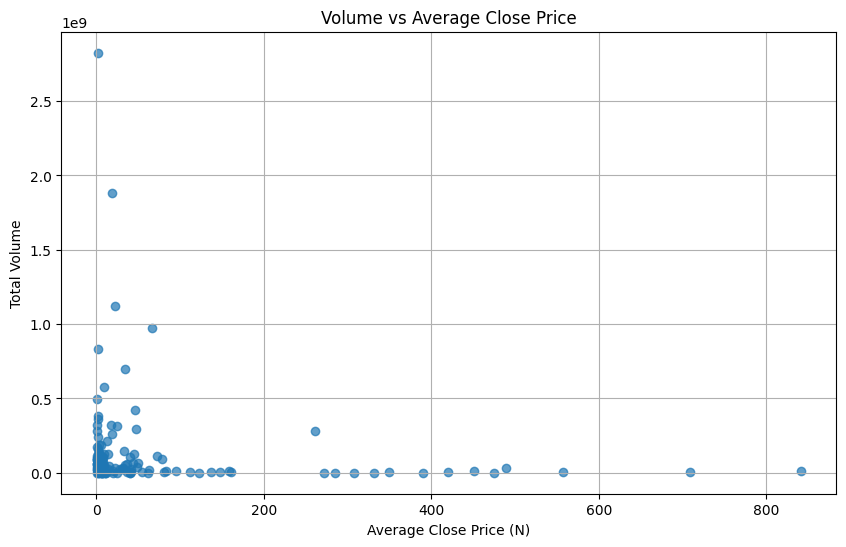

In [91]:
plt.figure(figsize=(10,6))
plt.scatter(combined_analysis["Close"],
            combined_analysis["Volume"], alpha = 0.7)
plt.title("Volume vs Average Close Price")
plt.xlabel("Average Close Price (N)")
plt.ylabel("Total Volume")
plt.grid(True)
plt.show()

C:\Users\viktor\AppData\Local\Temp\ipykernel_14012\869610378.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Symbol", y = "Volume", data = top_10_volume, palette="Blues_d") # Generates a bar plot using Seaborn, showing 'Volume' for each 'Symbol' from 'top_10_volume' DataFrame with a blue color palette.


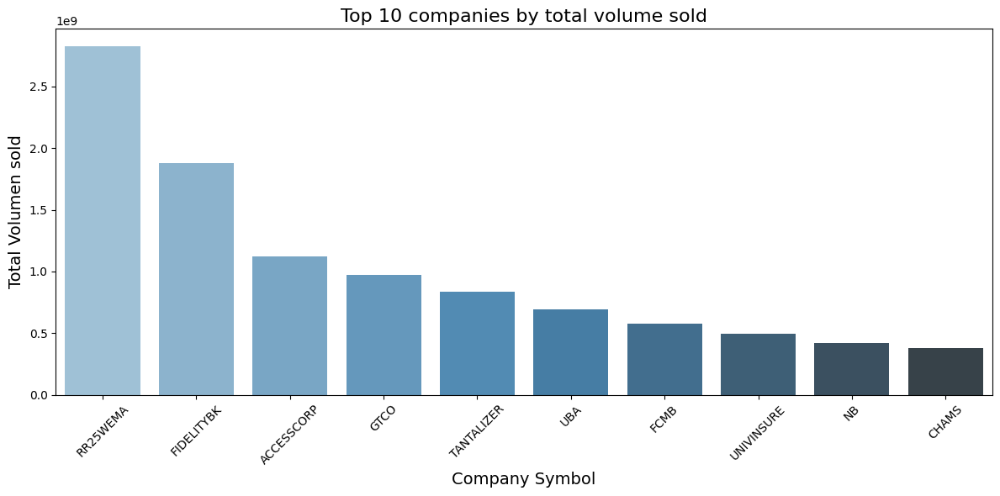

In [92]:
plt.figure(figsize=(12,6)) # Creates a new figure for the plot with a specified width of 12 inches and height of 6 inches.
sns.barplot(x="Symbol", y = "Volume", data = top_10_volume, palette="Blues_d") # Generates a bar plot using Seaborn, showing 'Volume' for each 'Symbol' from 'top_10_volume' DataFrame with a blue color palette.

plt.title("Top 10 companies by total volume sold", fontsize = 16) # Sets the title of the plot to "Top 10 companies by total volume sold" with a font size of 16.
plt.xlabel("Company Symbol", fontsize = 14) # Sets the label for the x-axis to "Company Symbol" with a font size of 14.
plt.ylabel("Total Volumen sold", fontsize = 14) # Sets the label for the y-axis to "Total Volume sold" with a font size of 14.

plt.xticks(rotation = 45) # Rotates the x-axis tick labels by 45 degrees for better readability.
plt.tight_layout() # Adjusts plot parameters for a tight layout, preventing labels from overlapping.
plt.show() # Displays the generated plot.

C:\Users\viktor\AppData\Local\Temp\ipykernel_14012\3885629027.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Symbol", y = "Volume", data = bottom_10_volume, palette="Blues_d") # Generates a bar plot using Seaborn, showing 'Volume' for each 'Symbol' from 'bottom_10_volume' DataFrame with a blue color palette.


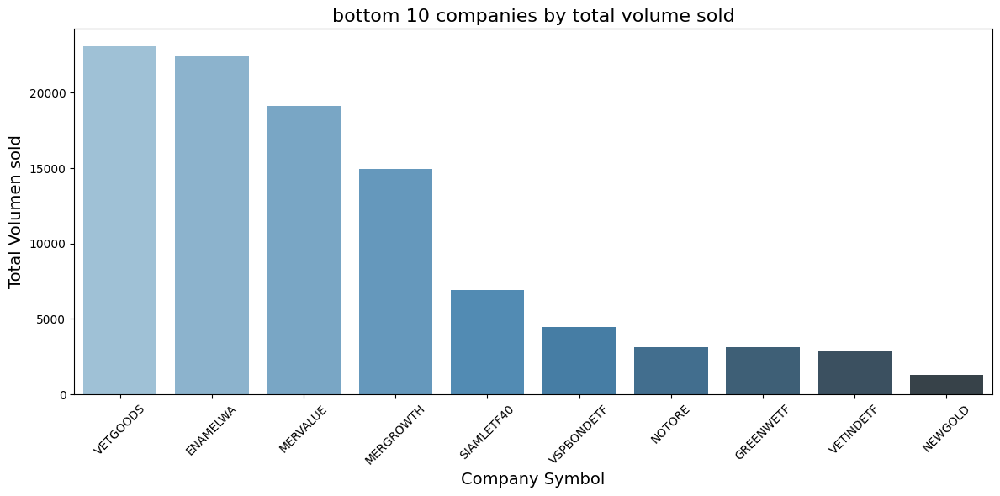

In [93]:
plt.figure(figsize=(12,6)) # Creates a new figure for the plot with a specified width of 12 inches and height of 6 inches.
sns.barplot(x="Symbol", y = "Volume", data = bottom_10_volume, palette="Blues_d") # Generates a bar plot using Seaborn, showing 'Volume' for each 'Symbol' from 'bottom_10_volume' DataFrame with a blue color palette.

plt.title("bottom 10 companies by total volume sold", fontsize = 16) # Sets the title of the plot to "Bottom 10 companies by total volume sold" with a font size of 16.
plt.xlabel("Company Symbol", fontsize = 14) # Sets the label for the x-axis to "Company Symbol" with a font size of 14.
plt.ylabel("Total Volumen sold", fontsize = 14) # Sets the label for the y-axis to "Total Volume sold" with a font size of 14.

plt.xticks(rotation = 45) # Rotates the x-axis tick labels by 45 degrees for better readability.
plt.tight_layout() # Adjusts plot parameters for a tight layout, preventing labels from overlapping.
plt.show() # Displays the generated plot.

C:\Users\viktor\AppData\Local\Temp\ipykernel_14012\4221277763.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Symbol', y='Close', data=top_10_avg_close, palette='Greens_d')


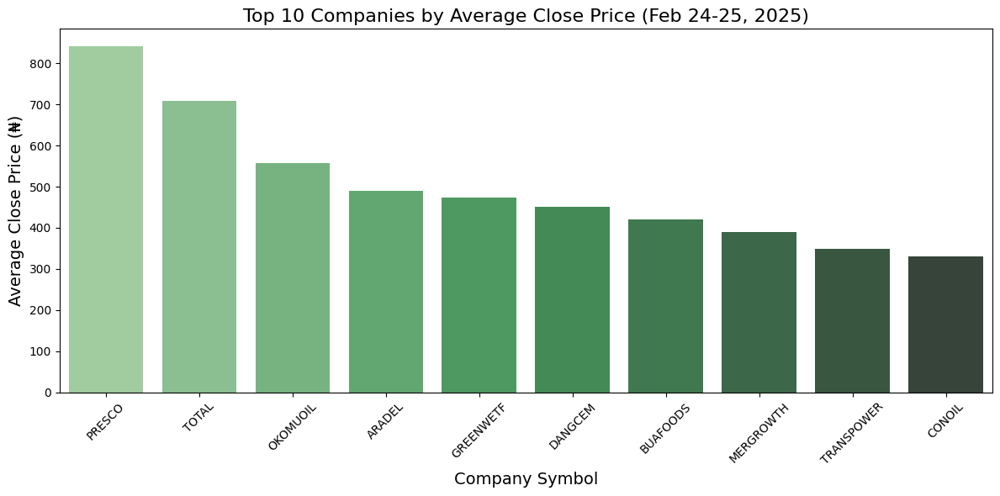

In [94]:
# Step 1: (Assuming you already calculated `average_close` DataFrame)

# Step 2: Select Top 10 by Average Close Price
top_10_avg_close = average_close.head(10)

# Step 3: Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='Symbol', y='Close', data=top_10_avg_close, palette='Greens_d')

# Add titles and labels
plt.title('Top 10 Companies by Average Close Price (Feb 24-25, 2025)', fontsize=16)
plt.xlabel('Company Symbol', fontsize=14)
plt.ylabel('Average Close Price (₦)', fontsize=14)

# Rotate x-labels for better readability
plt.xticks(rotation=45)
plt.tight_layout()

# Show plot
plt.show()


C:\Users\viktor\AppData\Local\Temp\ipykernel_14012\3530051541.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Symbol', y='Close', data=bottom_10_avg_close, palette='Greens_d')


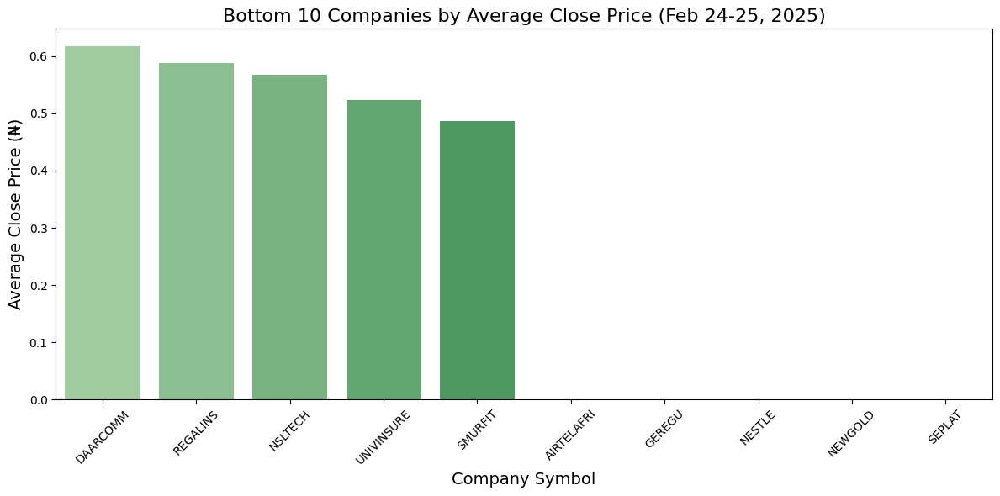

In [95]:
# Step 1: (Assuming you already calculated `average_close` DataFrame)

# Step 3: Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='Symbol', y='Close', data=bottom_10_avg_close, palette='Greens_d')

# Add titles and labels
plt.title('Bottom 10 Companies by Average Close Price (Feb 24-25, 2025)', fontsize=16)
plt.xlabel('Company Symbol', fontsize=14)
plt.ylabel('Average Close Price (₦)', fontsize=14)

# Rotate x-labels for better readability
plt.xticks(rotation=45)
plt.tight_layout()

# Show plot
plt.show()

In [96]:
df_combined = df.sort_values(by=["Symbol", "Day"])

In [97]:
df_combined.tail(10)

,Symbol,Close,Volume,Date,Day
1462,ZENITHBANK,46.50,22935274,2025-05-27,5
1602,ZENITHBANK,46.40,6478414,2025-05-27,6
2012,ZENITHBANK,47.50,24481513,2025-05-27,7
2282,ZENITHBANK,49.00,38471894,2025-05-27,8
2550,ZENITHBANK,48.90,21796892,2025-05-27,9
2958,ZENITHBANK,48.50,27351584,2025-05-27,10
3526,ZENITHBANK,48.05,12656649,2025-05-27,11
3666,ZENITHBANK,47.95,20148753,2025-05-27,12
3946,ZENITHBANK,47.40,11614640,2025-05-27,13
4088,ZENITHBANK,48.25,17941321,2025-05-27,14


In [98]:
df_combined["Close_pct_change"] = df_combined.groupby("Symbol")["Close"].pct_change() * 100 # Calculates the percentage change in 'Close' price for each 'Symbol' over time and stores it in a new column 'Close_pct_change'.

C:\Users\viktor\AppData\Local\Temp\ipykernel_14012\341787750.py:1: FutureWarning: The default fill_method='ffill' in SeriesGroupBy.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df_combined["Close_pct_change"] = df_combined.groupby("Symbol")["Close"].pct_change() * 100 # Calculates the percentage change in 'Close' price for each 'Symbol' over time and stores it in a new column 'Close_pct_change'.


In [99]:
df_combined.head(10)

,Symbol,Close,Volume,Date,Day,Close_pct_change
1,ABBEYBDS,4.73,226748,2025-05-27,1,NaN
137,ABBEYBDS,4.73,93,2025-05-27,2,0.000000
271,ABBEYBDS,4.73,66000,2025-05-27,3,0.000000
401,ABBEYBDS,6.74,216704,2025-05-27,4,42.494715
537,ABBEYBDS,7.41,141848,2025-05-27,5,9.940653
669,ABBEYBDS,8.15,503288,2025-05-27,6,9.986505
801,ABBEYBDS,8.96,989001,2025-05-27,7,9.938650
935,ABBEYBDS,9.76,3932594,2025-05-27,8,8.928571
1069,ABBEYBDS,8.79,1760532,2025-05-27,9,-9.938525
1201,ABBEYBDS,8.79,246845,2025-05-27,10,0.000000


In [100]:
df_combined.fillna(0, inplace=True)

In [101]:
df_combined["Growth"] = (df_combined["Close_pct_change"]/100) + 1 # Calculates a 'Growth' factor by converting the percentage change in 'Close' price to a decimal and adding 1.

In [102]:
df_combined["Cumulative_Return"] = df_combined.groupby("Symbol")["Growth"].cumprod() # Calculates the cumulative product of the 'Growth' factor for each 'Symbol' over time, representing the total return.

In [103]:
df_combined['Cumulative_Return'] = (df_combined['Cumulative_Return'] - 1) * 100 # Converts the 'Cumulative_Return' from a multiplicative factor to a percentage return.

In [104]:
df_combined.head(10)

,Symbol,Close,Volume,Date,Day,Close_pct_change,Growth,Cumulative_Return
1,ABBEYBDS,4.73,226748,2025-05-27,1,0.000000,1.000000,0.000000
137,ABBEYBDS,4.73,93,2025-05-27,2,0.000000,1.000000,0.000000
271,ABBEYBDS,4.73,66000,2025-05-27,3,0.000000,1.000000,0.000000
401,ABBEYBDS,6.74,216704,2025-05-27,4,42.494715,1.424947,42.494715
537,ABBEYBDS,7.41,141848,2025-05-27,5,9.940653,1.099407,56.659619
669,ABBEYBDS,8.15,503288,2025-05-27,6,9.986505,1.099865,72.304440
801,ABBEYBDS,8.96,989001,2025-05-27,7,9.938650,1.099387,89.429175
935,ABBEYBDS,9.76,3932594,2025-05-27,8,8.928571,1.089286,106.342495
1069,ABBEYBDS,8.79,1760532,2025-05-27,9,-9.938525,0.900615,85.835095
1201,ABBEYBDS,8.79,246845,2025-05-27,10,0.000000,1.000000,85.835095


In [105]:
summary = df_combined.groupby("Symbol")["Close_pct_change"].describe()
summary

,count,mean,std,min,25%,50%,75%,max
Symbol,,,,,,,,
ABBEYBDS,31.0,1.889069,9.017440,-10.000000,0.000000,0.000000,0.000000,42.494715
ABCTRANS,31.0,2.322403,6.149890,-9.830508,0.000000,0.000000,8.832252,10.000000
ACADEMY,31.0,1.834395,4.989853,-7.327586,0.000000,0.000000,1.136364,20.538721
ACCESSCORP,31.0,-0.048596,3.038947,-8.388521,-1.235698,0.227790,1.548582,6.818182
AFRIPRUD,31.0,0.435086,3.938051,-5.882353,-1.630856,0.000000,2.165751,9.933775
...,...,...,...,...,...,...,...,...
VSPBONDETF,25.0,8.200504,39.958459,-50.764444,-10.676157,0.000000,11.952191,117.391304
WAPCO,31.0,0.533257,2.321452,-4.881025,0.000000,0.000000,0.311405,10.000000
WAPIC,31.0,0.004042,4.072924,-8.849558,-1.614833,0.000000,2.298761,6.603774


In [106]:
avg_returns = df_combined.groupby("Symbol")["Close_pct_change"].mean().sort_values(ascending=False)

In [107]:
print(f"Top Performing companies (Avg. Returns): {avg_returns.head(10)}")

Top Performing companies (Avg. Returns): Symbol
RR25WEMA      51.177328
VSPBONDETF     8.200504
SMURFIT        5.643892
BETAGLAS       3.251272
ABCTRANS       2.322403
INTBREW        2.132133
ABBEYBDS       1.889069
CHAMPION       1.844674
ACADEMY        1.834395
CAVERTON       1.805419
Name: Close_pct_change, dtype: float64


In [108]:
print(f"bottom Performing companies (Avg. Returns): {avg_returns.tail(10)}")

bottom Performing companies (Avg. Returns): Symbol
TANTALIZER     -0.391893
VFDGROUP       -0.443413
SIAMLETF40     -0.501425
SUNUASSUR      -0.577072
ROYALEX        -0.595155
MRS            -0.642477
PZ             -0.676670
STANBICETF30   -0.835451
HMCALL         -0.921162
GREENWETF      -1.386424
Name: Close_pct_change, dtype: float64


In [109]:
volatility = df_combined.groupby("Symbol")["Close_pct_change"].std().sort_values(ascending=False)

In [110]:
print(f"most volatile companies: {volatility.head(10)}")

most volatile companies: Symbol
RR25WEMA      205.953485
VSPBONDETF     39.958459
VFDGROUP       19.929287
ABBEYBDS        9.017440
GREENWETF       7.927693
LOTUSHAL15      7.657021
MULTIVERSE      7.404868
UNIONDICON      7.167947
MCNICHOLS       6.650323
ABCTRANS        6.149890
Name: Close_pct_change, dtype: float64


In [111]:
print(f"least volatile companies: {volatility.tail(10)}")

least volatile companies: Symbol
GEREGU     0.0
JULI       0.0
MORISON    0.0
SCOA       0.0
NIDF       0.0
SEPLAT     0.0
NESTLE     0.0
NEWGOLD    0.0
NOTORE     0.0
NCR        0.0
Name: Close_pct_change, dtype: float64


In [112]:
df_combined.columns

Index(['Symbol', 'Close', 'Volume', 'Date', 'Day', 'Close_pct_change',
       'Growth', 'Cumulative_Return'],
      dtype='object')

In [113]:
df_combined["Day"]

1        1
137      2
271      3
401      4
537      5
        ..
2958    10
3526    11
3666    12
3946    13
4088    14
Name: Day, Length: 4056, dtype: int64

In [114]:
top_n = 5
top_symbols = avg_returns.head(top_n).index.tolist()
top_symbols

['RR25WEMA', 'VSPBONDETF', 'SMURFIT', 'BETAGLAS', 'ABCTRANS']

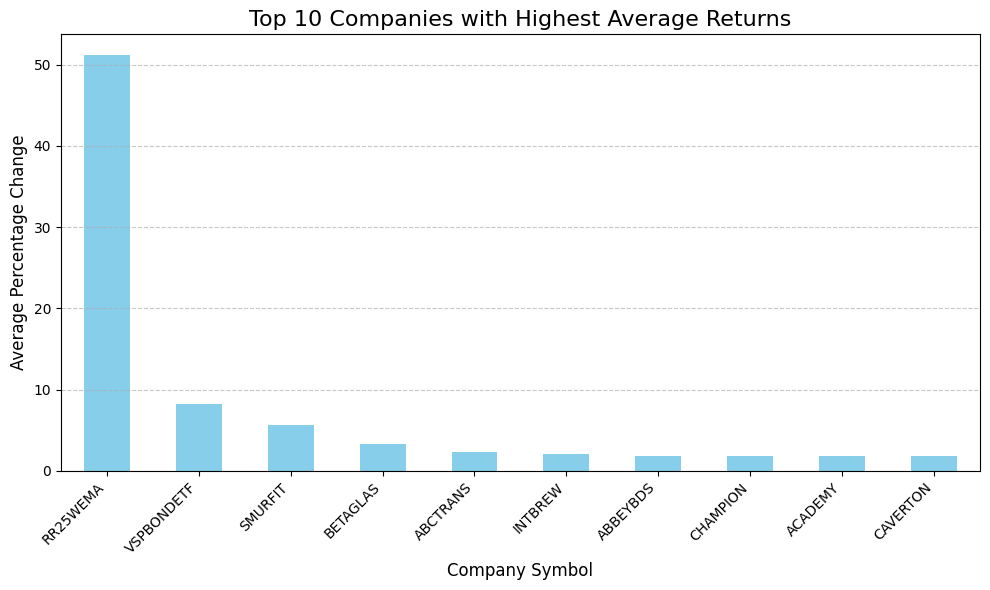

In [115]:
top_10_companies = avg_returns.head(10)
plt.figure(figsize=(10, 6))  # Adjust figure size for better readability
top_10_companies.plot(kind='bar', color='skyblue')
plt.title('Top 10 Companies with Highest Average Returns', fontsize=16)
plt.xlabel('Company Symbol', fontsize=12)
plt.ylabel('Average Percentage Change', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add a grid for easier comparison
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()

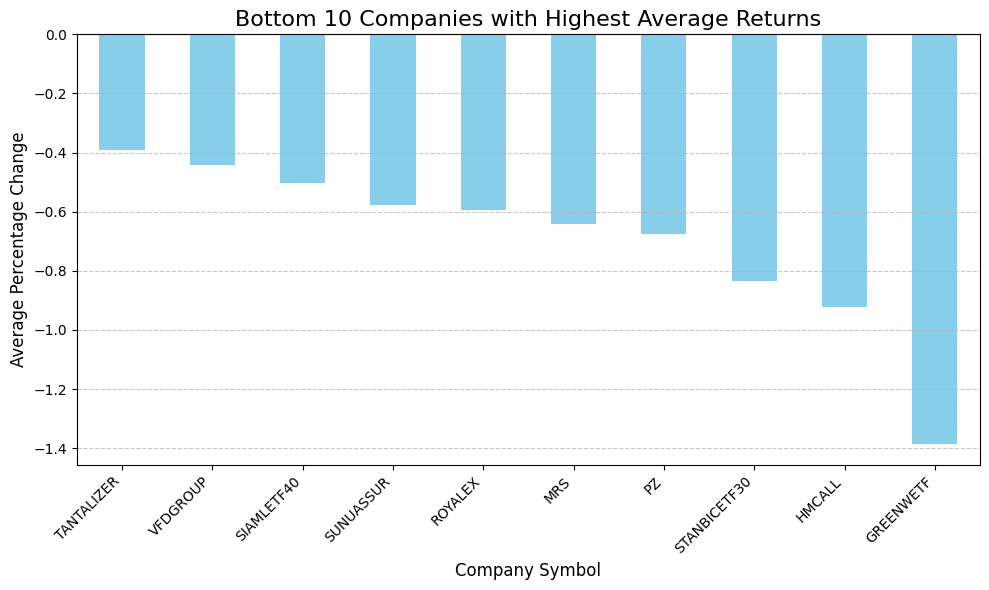

In [116]:
bottom_10_companies = avg_returns.tail(10)
plt.figure(figsize=(10, 6))  # Adjust figure size for better readability
bottom_10_companies.plot(kind='bar', color='skyblue')
plt.title('Bottom 10 Companies with Highest Average Returns', fontsize=16)
plt.xlabel('Company Symbol', fontsize=12)
plt.ylabel('Average Percentage Change', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add a grid for easier comparison
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()

In [117]:
correlation = df_combined.groupby('Symbol')[['Close_pct_change', 'Volume']].corr()
print("\nCorrelation between Pct_Change and Volume:")
print(correlation)


Correlation between Pct_Change and Volume:
                             Close_pct_change    Volume
Symbol                                                 
ABBEYBDS   Close_pct_change          1.000000  0.113310
           Volume                    0.113310  1.000000
ABCTRANS   Close_pct_change          1.000000  0.182507
           Volume                    0.182507  1.000000
ACADEMY    Close_pct_change          1.000000  0.504201
...                                       ...       ...
WAPIC      Volume                   -0.266081  1.000000
WEMABANK   Close_pct_change          1.000000  0.238954
           Volume                    0.238954  1.000000
ZENITHBANK Close_pct_change          1.000000  0.384684
           Volume                    0.384684  1.000000

[284 rows x 2 columns]


In [118]:
def rolling_trend(series, window=10):
    """Calculates a rolling average and checks if the latest trend is upwards."""
    rolling_avg = series.rolling(window=window).mean()
    if rolling_avg.notna().any():  # Check for NaN values
        return rolling_avg.iloc[-1] > rolling_avg.iloc[-window] # Is last value higher than value 'window' days ago?
    else:
        return False

rolling_uptrend = df_combined.groupby('Symbol')['Close_pct_change'].apply(rolling_trend)
print("\nStocks with rolling uptrend:")
print(rolling_uptrend[rolling_uptrend])


Stocks with rolling uptrend:
Symbol
ABBEYBDS        True
ACCESSCORP      True
AFRIPRUD        True
BUAFOODS        True
CAP             True
CONHALLPLC      True
CORNERST        True
CUSTODIAN       True
CUTIX           True
DANGSUGAR       True
DEAPCAP         True
ELLAHLAKES      True
ETERNA          True
ETI             True
ETRANZACT       True
EUNISELL        True
FIRSTHOLDCO     True
GUINNESS        True
HMCALL          True
HONYFLOUR       True
IKEJAHOTEL      True
JAIZBANK        True
JAPAULGOLD      True
JOHNHOLT        True
LASACO          True
LINKASSURE      True
MANSARD         True
MBENEFIT        True
MCNICHOLS       True
NAHCO           True
NASCON          True
NPFMCRFBK       True
OKOMUOIL        True
OMATEK          True
PRESTIGE        True
REDSTAREX       True
REGALINS        True
ROYALEX         True
RTBRISCOE       True
SOVRENINS       True
STANBICETF30    True
TANTALIZER      True
TRANSEXPR       True
TRANSPOWER      True
UCAP            True
UNILEVER        Tr

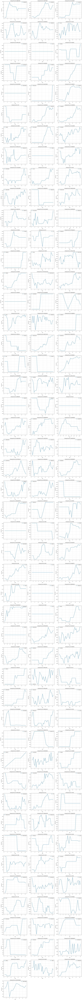

In [120]:
import matplotlib.pyplot as plt
import pandas as pd
import math # Import math for ceil function

# Assuming your DataFrame is called 'df_combined' (from previous context)

# 1. Get Unique Symbols
unique_symbols = df_combined["Symbol"].unique()

# 2. Determine the number of rows and columns needed for the subplots
num_symbols = len(unique_symbols)
num_cols = 3  # Let's try 3 columns for better layout and to reduce vertical size
num_rows = math.ceil(num_symbols / num_cols) # Calculate rows needed based on number of symbols and columns

# 3. Create the figure and subplots
# Adjust figure height based on the new number of rows
# A reasonable aspect ratio for a single subplot might be 12x6, so for each row of subplots, adjust height.
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(16, 4 * num_rows)) # Increased width to accommodate 3 columns, reduced height per row.
# Flatten the axes array if there's more than one row/column for easier iteration
axes = axes.flatten()

# 4. Loop Through Symbols and Plot
for i, symbol in enumerate(unique_symbols):
    # Filter data for the current symbol
    symbol_data = df_combined[df_combined['Symbol'] == symbol]

    # Select the correct subplot from the flattened axes array
    ax = axes[i]

    # Plot the data
    ax.plot(symbol_data['Day'], symbol_data['Close'], label=symbol)
    ax.set_title(f'Closing Price for {symbol}', fontsize=10)
    ax.set_xlabel('Day', fontsize=8)
    ax.set_ylabel('Close Price', fontsize=8)
    ax.tick_params(axis='x', rotation=45, labelsize=6)
    ax.tick_params(axis='y', labelsize=8)
    ax.legend(fontsize=8)
    ax.grid(True, linestyle='--', alpha=0.5)

# 5. Hide any unused subplots if num_symbols is not a perfect multiple of num_cols
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j]) # Deletes unused subplots to prevent empty plots from showing

# 6. Adjust layout and show
plt.tight_layout() # Adjust layout to prevent overlapping
plt.show()